# Wine Quality Analysis

<img src="https://thumbor.forbes.com/thumbor/fit-in/1200x0/filters%3Aformat%28jpg%29/https%3A%2F%2Fspecials-images.forbesimg.com%2Fdam%2Fimageserve%2F1133888244%2F0x0.jpg%3Ffit%3Dscale" width="600px" />

This notebook analyse a database of **red** and **white** variants of the Portuguese "Vinho Verde" wine based on wine **physicochemical test results** and quality scores that experts assign to each wine sample.

In [90]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [9]:
np.random.seed(42)

plt.rcParams['figure.figsize'] = (12, 8)
sns.set_theme(style='whitegrid')

In [2]:
full_df = pd.read_csv('data/winequalityN.csv')

## Database Overview

In [3]:
full_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6497 entries, 0 to 6496
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   type                  6497 non-null   object 
 1   fixed acidity         6487 non-null   float64
 2   volatile acidity      6489 non-null   float64
 3   citric acid           6494 non-null   float64
 4   residual sugar        6495 non-null   float64
 5   chlorides             6495 non-null   float64
 6   free sulfur dioxide   6497 non-null   float64
 7   total sulfur dioxide  6497 non-null   float64
 8   density               6497 non-null   float64
 9   pH                    6488 non-null   float64
 10  sulphates             6493 non-null   float64
 11  alcohol               6497 non-null   float64
 12  quality               6497 non-null   int64  
dtypes: float64(11), int64(1), object(1)
memory usage: 660.0+ KB


In [5]:
full_df.head()

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,white,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,white,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,white,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


In [21]:
full_df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
fixed acidity,6487.0,7.216579,1.296750,3.80000,6.40000,7.00000,7.70000,15.90000
volatile acidity,6489.0,0.339691,0.164649,0.08000,0.23000,0.29000,0.40000,1.58000
citric acid,6494.0,0.318722,0.145265,0.00000,0.25000,0.31000,0.39000,1.66000
residual sugar,6495.0,5.444326,4.758125,0.60000,1.80000,3.00000,8.10000,65.80000
chlorides,6495.0,0.056042,0.035036,0.00900,0.03800,0.04700,0.06500,0.61100
free sulfur dioxide,6497.0,30.525319,17.749400,1.00000,17.00000,29.00000,41.00000,289.00000
total sulfur dioxide,6497.0,115.744574,56.521855,6.00000,77.00000,118.00000,156.00000,440.00000
density,6497.0,0.994697,0.002999,0.98711,0.99234,0.99489,0.99699,1.03898
pH,6488.0,3.218395,0.160748,2.72000,3.11000,3.21000,3.32000,4.01000
sulphates,6493.0,0.531215,0.148814,0.22000,0.43000,0.51000,0.60000,2.00000


### Missing Values

In [4]:
full_df.isnull().sum()

type                     0
fixed acidity           10
volatile acidity         8
citric acid              3
residual sugar           2
chlorides                2
free sulfur dioxide      0
total sulfur dioxide     0
density                  0
pH                       9
sulphates                4
alcohol                  0
quality                  0
dtype: int64

## Wine Quality Distribution

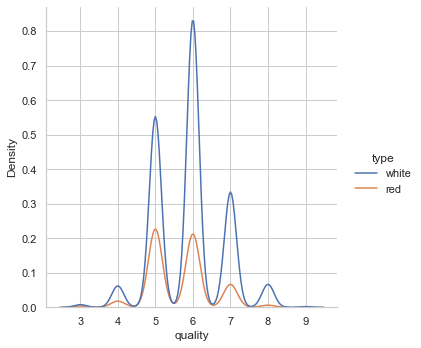

In [19]:
sns.displot(data=full_df, x='quality', hue='type', kind='kde')

## Wine Physicochemical Analysis

Text(0.5, 1.0, 'White Wine')

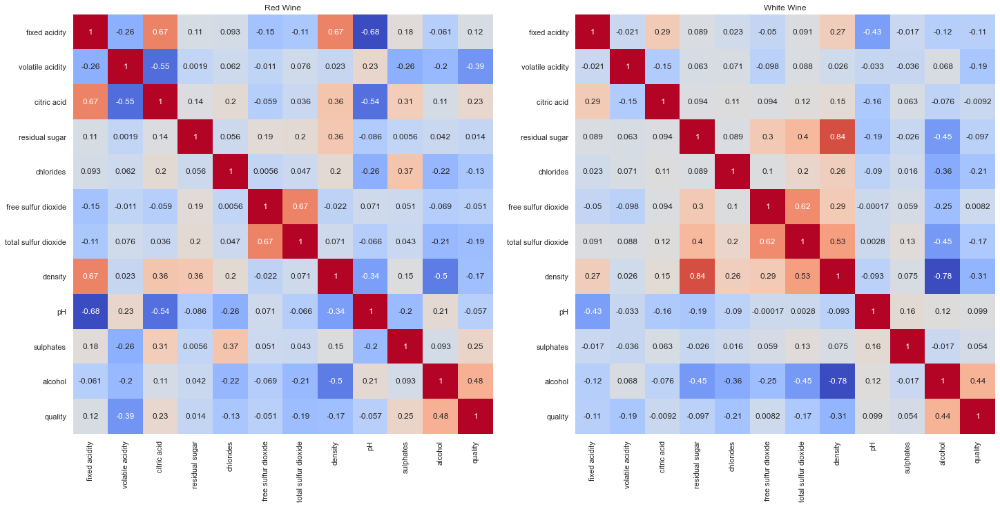

In [93]:
fig, (ax0, ax1) = plt.subplots(1, 2, constrained_layout=True, figsize=(20, 20))

sns.heatmap(red_wine_df.corr(), annot=True, square=True, cmap='coolwarm', cbar=False, ax=ax0)
ax0.set_title('Red Wine')

sns.heatmap(white_wine_df.corr(), annot=True, square=True, cmap='coolwarm', cbar=False, ax=ax1)
ax1.set_title('White Wine')

### Wine Type

In [71]:
full_df['type'].value_counts()

white    4898
red      1599
Name: type, dtype: int64

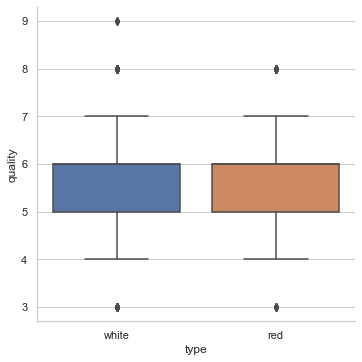

In [43]:
sns.catplot(data=full_df, x='type', y='quality', kind='box')

In [45]:
red_wine_df = full_df[full_df['type'] == 'red']
white_wine_df = full_df[full_df['type'] == 'white']

### Acidity and pH

- **fixed acidity** (tartaric acid - $g/dm^3$) - most acids involved with wine or fixed or nonvolatile (do not evaporate readily)
- **volatile acidity** (acetic acid - $g/dm^3$) - the amount of acetic acid in wine, which at too high of levels can lead to an unpleasant, vinegar taste
- **citric acid** ($g/dm^3$) - found in small quantities, citric acid can add "freshness" and flavor to wines
- **pH** - describes how acidic or basic a wine is on a scale from 0 (very acidic) to 14 (very basic); most wines are between 3-4 on the pH scale

https://waterhouse.ucdavis.edu/whats-in-wine/fixed-acidity

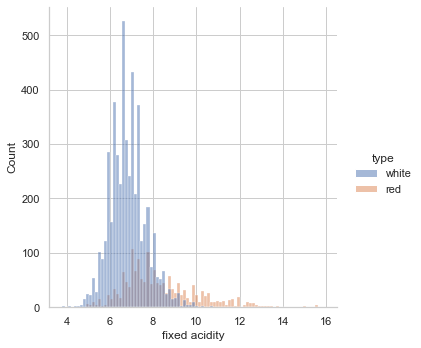

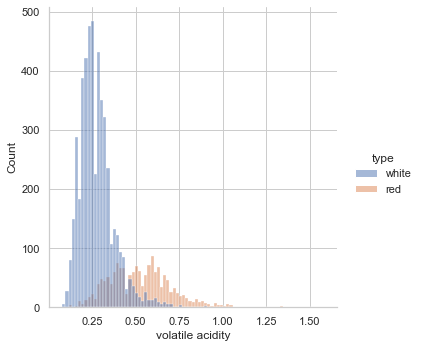

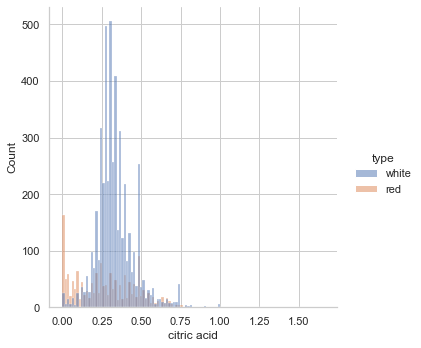

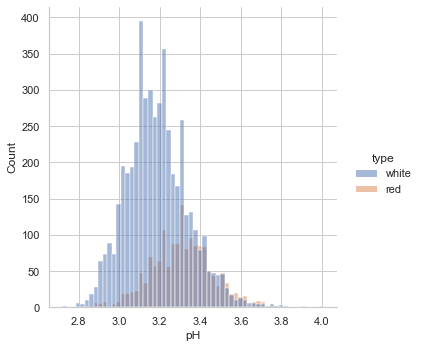

In [70]:
sns.displot(data=full_df, x='fixed acidity', hue='type')
sns.displot(data=full_df, x='volatile acidity', hue='type')
sns.displot(data=full_df, x='citric acid', hue='type')
sns.displot(data=full_df, x='pH', hue='type')

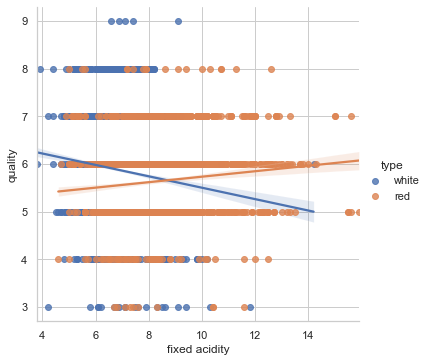

In [51]:
sns.lmplot(data=full_df, x='fixed acidity', y='quality', hue='type')

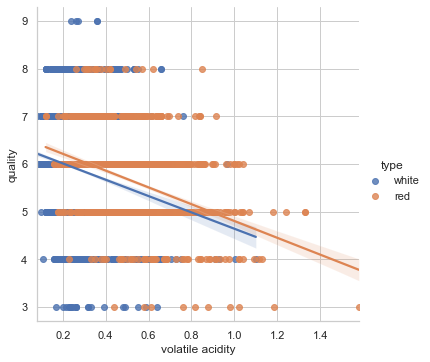

In [50]:
sns.lmplot(data=full_df, x='volatile acidity', y='quality', hue='type')

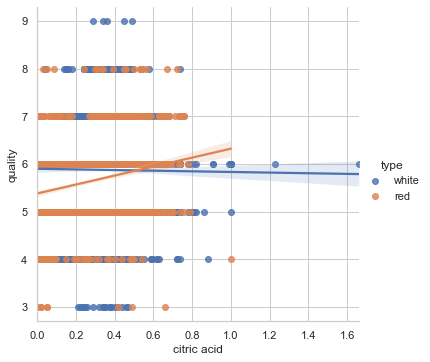

In [48]:
sns.lmplot(data=full_df, x='citric acid', y='quality', hue='type')

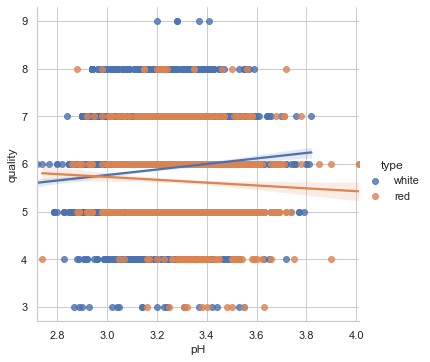

In [47]:
sns.lmplot(data=full_df, x='pH', y='quality', hue='type')

### Sugar, Alcohol and Density

- **residual sugar** ($g/dm^3$) - the amount of **sugar** remaining after **fermentation stops**, it's rare to find wines with less than 1 gram/liter and wines with greater than 45 grams/liter are considered sweet
- **alcohol** (% by volume) - the percent alcohol content of the wine
- **density** ($g/cm^3$) - the density of water is close to that of water depending on the percent alcohol and sugar content

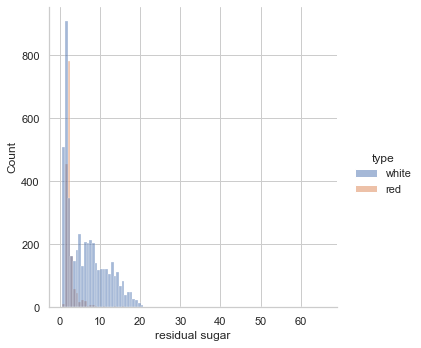

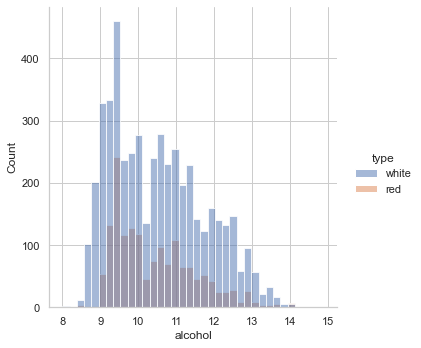

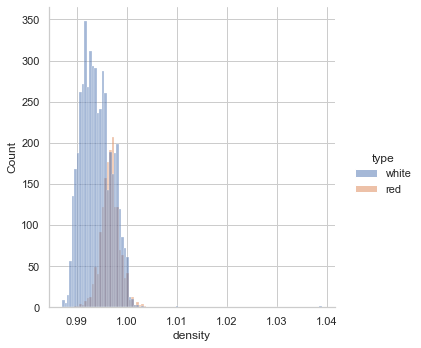

In [73]:
sns.displot(data=full_df, x='residual sugar', hue='type')
sns.displot(data=full_df, x='alcohol', hue='type')
sns.displot(data=full_df, x='density', hue='type')

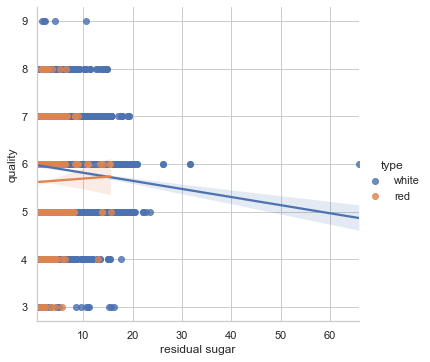

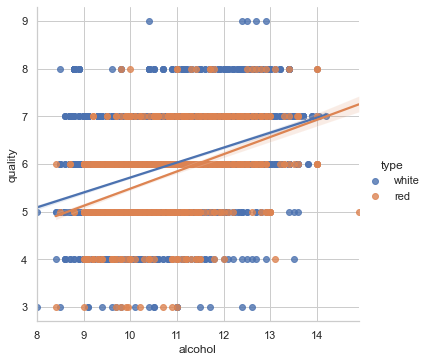

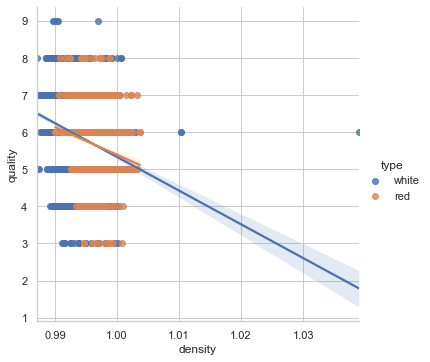

In [54]:
sns.lmplot(data=full_df, x='residual sugar', y='quality', hue='type')
sns.lmplot(data=full_df, x='alcohol', y='quality', hue='type')
sns.lmplot(data=full_df, x='density', y='quality', hue='type')

### Sulfur Dioxide and Sulphates

- **free sulfur dioxide** ($mg/dm^3$) - the free form of $SO_{2}$ exists in equilibrium between molecular $SO_{2}$ (as a dissolved gas) and bisulfite ion; it prevents microbial growth and the oxidation of wine
- **total sulfur dioxide** ($mg/dm^3$) - amount of free and bound forms of $SO_{2}$; in low concentrations, $SO_{2}$ is mostly undetectable in wine, but at free $SO_{2}$ concentrations over 50 ppm, $SO_{2}$ becomes evident in the nose and taste of wine
- **sulphates** (potassium sulphate - $g/dm^3$) - a wine additive which can contribute to sulfur dioxide gas ($SO_{2}$) levels, wich acts as an antimicrobial and antioxidant

<AxesSubplot:xlabel='free sulfur dioxide', ylabel='Count'>

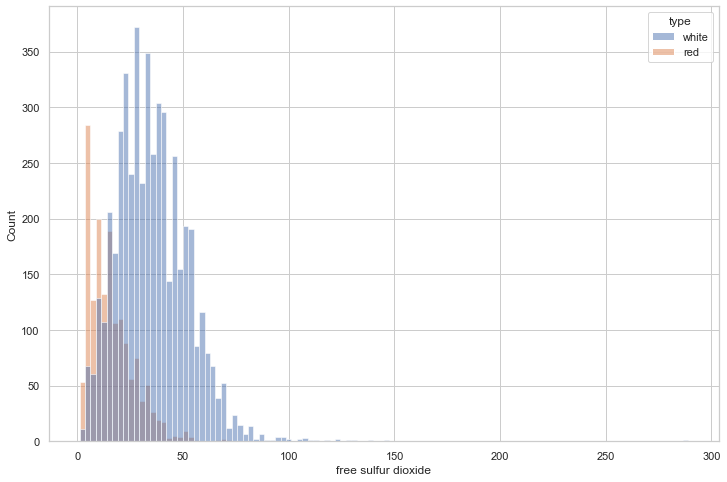

In [64]:
sns.histplot(data=full_df, x='free sulfur dioxide', hue='type')

<AxesSubplot:xlabel='total sulfur dioxide', ylabel='Count'>

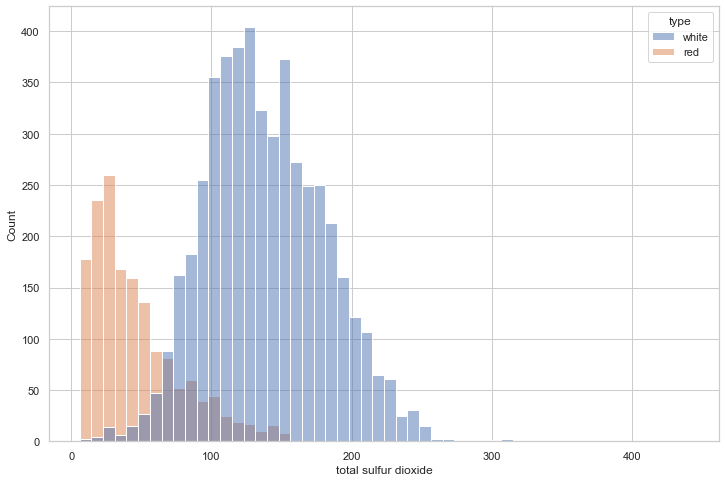

In [65]:
sns.histplot(data=full_df, x='total sulfur dioxide', hue='type')

<AxesSubplot:xlabel='sulphates', ylabel='Count'>

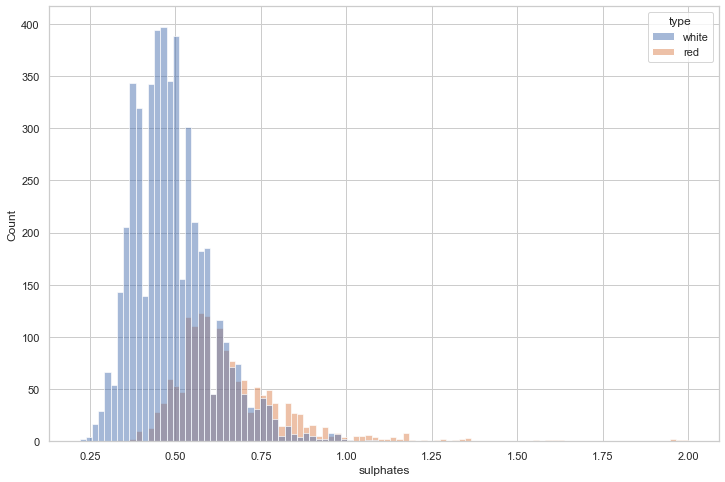

In [66]:
sns.histplot(data=full_df, x='sulphates', hue='type')

### Chlorides
**Chlorides** (**sodium chloride** - $g/dm^3$) - the amount of **salt** in the wine

<AxesSubplot:xlabel='chlorides', ylabel='Count'>

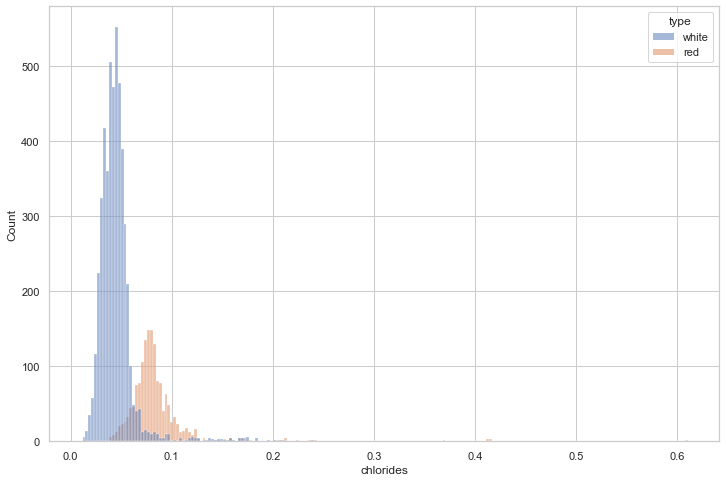

In [60]:
sns.histplot(data=full_df, x='chlorides', hue='type')

<AxesSubplot:xlabel='chlorides', ylabel='quality'>

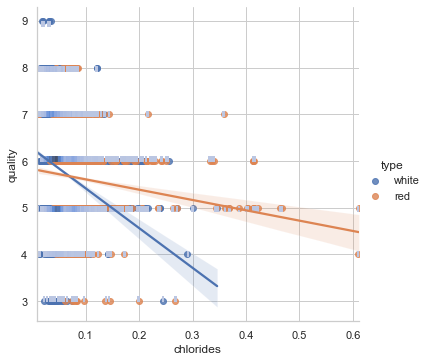

In [56]:
sns.lmplot(data=full_df, x='chlorides', y='quality', hue='type')

## Credits

- https://bibinmjose.github.io/RedWineDataAnalysis/
- https://s3.amazonaws.com/udacity-hosted-downloads/ud651/wineQualityInfo.txt